In [1]:
!git clone https://github.com/Stability-AI/StableCascade.git

Cloning into 'StableCascade'...
remote: Enumerating objects: 253, done.
remote: Counting objects: 100% (113/113), done.
remote: Compressing objects: 100% (73/73), done.
remote: Total 253 (delta 72), reused 40 (delta 40), pack-reused 140
Receiving objects: 100% (253/253), 119.02 MiB | 9.88 MiB/s, done.
Resolving deltas: 100% (96/96), done.


In [2]:
!cd StableCascade/models && ./download_models.sh essential big-big bfloat16

stage_a.safetensors 100%[===================>]  70.24M  11.2MB/s    in 6.3s    
previewer.safetenso 100%[===================>]  15.21M  10.7MB/s    in 1.4s    
effnet_encoder.safe 100%[===================>]  77.73M  11.2MB/s    in 7.0s    
stage_b_bf16.safete 100%[===================>]   2.91G  11.2MB/s    in 4m 33s  
stage_c_bf16.safete 100%[===================>]   6.68G  11.2MB/s    in 10m 25s 


In [3]:
!cd StableCascade/inference/ && wget https://huggingface.co/dome272/stable-cascade/resolve/main/imagenet_1024.tar -P inference -q --show-progress

imagenet_1024.tar   100%[===================>]  20.62M  10.8MB/s    in 1.9s    


In [1]:
import os
os.chdir('StableCascade')

In [2]:
import yaml
import torch
import zlib
import torch
import numpy as np
from tqdm import tqdm
from inference.utils import *
from core.utils import load_or_fail
from train import WurstCoreB
from scipy.stats import norm

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
config_file_b = 'configs/inference/stage_b_3b.yaml'
with open(config_file_b, "r", encoding="utf-8") as file:
    config_file_b = yaml.safe_load(file)
    
core = WurstCoreB(config_dict=config_file_b, device=device, training=False)
extras = core.setup_extras_pre()
data = core.setup_data(extras)
models = core.setup_models(extras)
models.generator.bfloat16();

['model_version', 'stage_a_checkpoint_path', 'effnet_checkpoint_path']
['transforms', 'clip_preprocess', 'gdf', 'sampling_configs', 'effnet_preprocess']
Training with batch size 4 (4/GPU)
['dataset', 'dataloader', 'iterator']


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

['tokenizer', 'text_model', 'generator', 'effnet', 'stage_a']


In [4]:
extras.sampling_configs['cfg'] = 1.1
extras.sampling_configs['shift'] = 1
extras.sampling_configs['timesteps'] = 10
extras.sampling_configs['t_start'] = 1.0

In [5]:
def compress(batch, factor=3/4):
    with torch.no_grad(), torch.cuda.amp.autocast(dtype=torch.bfloat16):
        scaled_image = downscale_images(batch['images'], factor)
        effnet_latents = models.effnet(extras.effnet_preprocess(scaled_image.to(device)))
        equalized = norm.cdf(effnet_latents.detach().cpu().to(torch.float))
        quantized = (16*equalized - 0.5).round()
        quantized = torch.tensor(quantized).to(torch.int8).numpy()
        original_shape = quantized.shape
        compressed_img = zlib.compress(quantized.tobytes(), level=9)
        conditions = core.get_conditions(batch, models, extras, is_eval=True, is_unconditional=False)
        unconditions = core.get_conditions(batch, models, extras, is_eval=True, is_unconditional=True)    
        c_clip = conditions['clip']
        u_clip = unconditions['clip']
        return compressed_img, original_shape, c_clip, u_clip

In [6]:
def decompress(compressed_img, original_shape, c_clip=torch.zeros(4,1,1280).cuda(), u_clip=torch.zeros(4,1,1280).cuda()):
    with torch.no_grad(), torch.cuda.amp.autocast(dtype=torch.bfloat16):
        decompressed = zlib.decompress(compressed_img)
        decompressed = np.frombuffer(decompressed, dtype=np.int8)
        decompressed = decompressed.reshape(original_shape)
        decompressed = norm.ppf((decompressed+0.5)/16)
        decompressed = torch.tensor(decompressed).cuda()
        conditions = {
            'effnet': decompressed,
            'clip':   c_clip
        }
        unconditions = {
            'effnet': torch.zeros_like(decompressed),
            'clip':   u_clip
        }
        sampling_b = extras.gdf.sample(
            models.generator, conditions, (4, 4, 256, 256),
            unconditions, device=device, **extras.sampling_configs
        )
        print(decompressed.shape)
        for (sampled_b, _, _) in tqdm(sampling_b, total=extras.sampling_configs['timesteps']):
            sampled_b = sampled_b
        sampled = models.stage_a.decode(sampled_b).float()
        return sampled

torch.Size([4, 16, 16, 16])


100%|███████████████████████████████████████████████████████████████████████████████████| 10/10 [00:14<00:00,  1.49s/it]


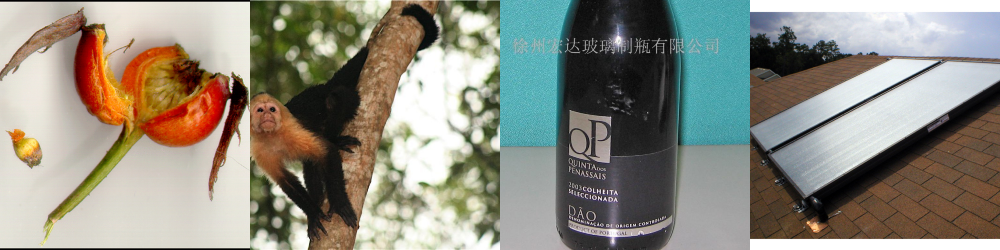

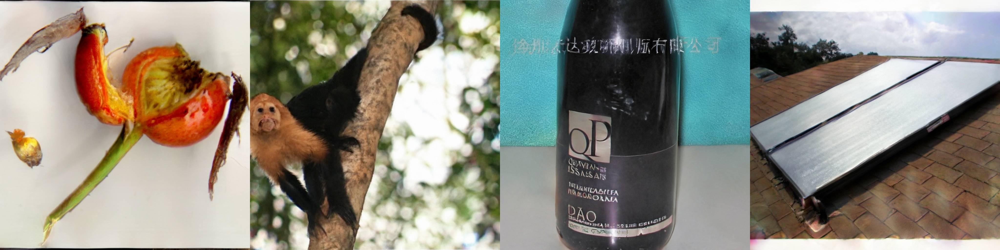

In [7]:
batch = next(data.iterator)
compressed_img, original_shape, _, _ = compress(batch,factor=1/2)
recovered_img = decompress(compressed_img, original_shape)

show_images(batch['images'])
show_images(recovered_img)

In [8]:
compression_ratio = np.prod([batch['images'].shape[i] for i in range(4)])/len(compressed_img)
compression_ratio

1346.7742695065824

## Compress a dataset

In [10]:
from datasets import load_dataset
from torchvision.transforms import Resize, CenterCrop

In [12]:
resize = Resize(size=512, max_size=None, antialias=True)
crop = CenterCrop(size=(512, 512))

In [35]:
def resize_compress(sample):
    img = sample['image']
    img = img.permute(2,0,1) 
    img = resize(img)
    img = crop(img) 
    img = img.unsqueeze(0)
    img = img.to(torch.float)
    img = img/255
    
    effnet_latents = models.effnet(extras.effnet_preprocess(img.to(device)))
    equalized = norm.cdf(effnet_latents.detach().cpu().to(torch.float))
    quantized = (16*equalized - 0.5).round()
    quantized = torch.tensor(quantized).to(torch.int8).numpy()
    original_shape = quantized[0].shape
    compressed_img = zlib.compress(quantized.tobytes(), level=9)
    sample['compressed_image'] = compressed_img
    sample['image'] = None
    return sample

In [14]:
imagenet = load_dataset("imagenet-1k",split='validation[0:8]',trust_remote_code=True)
rgb_imagenet = imagenet.filter(lambda s: s["image"].mode == "RGB").with_format("torch")
imagenet_compressed = rgb_imagenet.map(resize_compress).remove_columns("image")

Parameter 'function'=<function resize_compress at 0x709990cb7e20> of the transform datasets.arrow_dataset.Dataset._map_single couldn't be hashed properly, a random hash was used instead. Make sure your transforms and parameters are serializable with pickle or dill for the dataset fingerprinting and caching to work. If you reuse this transform, the caching mechanism will consider it to be different from the previous calls and recompute everything. This warning is only showed once. Subsequent hashing failures won't be showed.


Map:   0%|          | 0/8 [00:00<?, ? examples/s]

/home/server/.local/lib/python3.10/site-packages/datasets/features/image.py:332: UserWarning: Downcasting array dtype int64 to uint8 to be compatible with 'Pillow'
  warnings.warn(f"Downcasting array dtype {dtype} to {dest_dtype} to be compatible with 'Pillow'")


## Test the decoding

In [15]:
test_batch = imagenet_compressed[0:4]['compressed_image']

In [16]:
def decompress_b4(compressed_batch, original_shape=(16,16,16), c_clip=torch.zeros(4,1,1280).cuda(), u_clip=torch.zeros(4,1,1280).cuda()):
    with torch.no_grad(), torch.cuda.amp.autocast(dtype=torch.bfloat16):
        decompressed = [zlib.decompress(img) for img in compressed_batch]
        decompressed = [np.frombuffer(d, dtype=np.int8) for d in decompressed]
        decompressed = [d.reshape(original_shape) for d in decompressed]
        decompressed = [norm.ppf((d+0.5)/16) for d in decompressed]
        decompressed = [torch.tensor(d).cuda() for d in decompressed]
        decompressed = [d.unsqueeze(0) for d in decompressed]
        decompressed = torch.cat(decompressed)
        conditions = {
            'effnet': decompressed,
            'clip':   c_clip
        }
        unconditions = {
            'effnet': torch.zeros_like(decompressed),
            'clip':   u_clip
        }
        sampling_b = extras.gdf.sample(
            models.generator, conditions, (4, 4, 256, 256),
            unconditions, device=device, **extras.sampling_configs
        )
        print(decompressed.shape)
        for (sampled_b, _, _) in tqdm(sampling_b, total=extras.sampling_configs['timesteps']):
            sampled_b = sampled_b
        sampled = models.stage_a.decode(sampled_b).float()
        return sampled

torch.Size([4, 16, 16, 16])


100%|███████████████████████████████████████████████████████████████████████████████████| 10/10 [00:14<00:00,  1.48s/it]


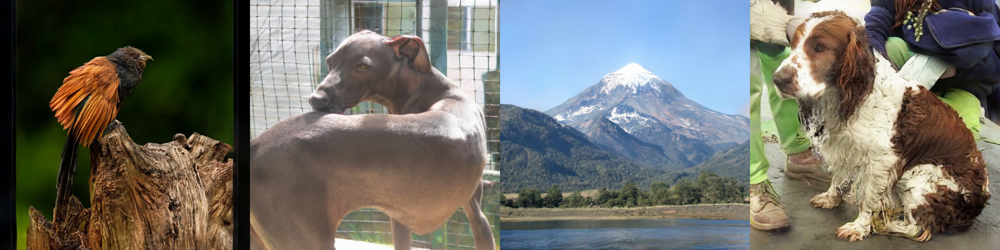

In [17]:
recovered_batch = decompress_b4(test_batch)
show_images(recovered_batch)

## Compress Food Dataset

In [44]:
for split in ['train', 'validation']:
    food101 = load_dataset("food101", split=split)
    rgb = food101.filter(lambda s: s["image"].mode == "RGB").with_format("torch")
    food101_compressed = rgb.map(resize_compress).remove_columns("image")
    food101_compressed.push_to_hub("danjacobellis/food101_cascade",split=split)

Filter:   0%|          | 0/25250 [00:00<?, ? examples/s]

Map:   0%|          | 0/25250 [00:00<?, ? examples/s]

Uploading the dataset shards:   0%|          | 0/1 [00:00<?, ?it/s]

Creating parquet from Arrow format:   0%|          | 0/253 [00:00<?, ?ba/s]

README.md:   0%|          | 0.00/3.15k [00:00<?, ?B/s]

## Compress ImageNet-1k

In [47]:
for split in ['train', 'validation']:
    imagenet = load_dataset("imagenet-1k", split=split)
    rgb = imagenet.filter(lambda s: s["image"].mode == "RGB").with_format("torch")
    imagenet_compressed = rgb.map(resize_compress).remove_columns("image")
    imagenet_compressed.push_to_hub("danjacobellis/imagenet_cascade",split=split)

/home/server/.local/lib/python3.10/site-packages/datasets/load.py:1461: FutureWarning: The repository for imagenet-1k contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/imagenet-1k
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this dataset from the next major release of `datasets`.
  warnings.warn(


Loading dataset shards:   0%|          | 0/257 [00:00<?, ?it/s]

Filter:   0%|          | 0/1281167 [00:00<?, ? examples/s]


KeyboardInterrupt

